DEPARTAMENTO DE CIÊNCIA DA COMPUTAÇÃO/ ICEx/ UFMG

Introdução ao Aprendizado Profundo

Prof. Flávio Figueiredo

# Trabalho Prático -  Image-to-Text

Etelvina Costa Santos Sá Oliveira - etelvina.oliveira2003@gmail.com

Filipe Pirola Santos - filipepirolasantos@hotmail.com

Igor Eduardo Martins Braga - igoreduardobraga@ufmg.br

## **1.  Problema Abordado / Image-to-Text**

O problema de Image-to-Text (geração de descrições textuais a partir de imagens) é uma tarefa desafiadora que combina visão computacional e processamento de linguagem natural (NLP). Sua importância reside em aplicações como:

*   **Acessibilidade:** Descrição automática de imagens para usuários com deficiência
*   **Bancos de dados multimídia:** Indexação e recuperação de imagens baseada em conteúdo.
*   **Robótica:** Interpretação de cenas em tempo real.

O objetivo das legendas para imagens é criar frases em linguagem natural que sejam lógicas e precisas, descrevendo o conteúdo de uma imagem. Isso depende da capacidade do modelo de legenda de identificar objetos e caracterizar adequadamente seus relacionamentos.

Exemplificando, os principais desafios para esse problema são:

*   **Complexidade semântica:** Uma imagem pode conter múltiplos objetos, relações e contextos (ex: "flor vermelha com folhas verdes em um vaso branco").
*   **Variabilidade:** Diferentes estilos de descrição (ex: detalhada vs. concisa) e ambiguidades (ex: "flor" pode ser "rosa", "tulipa", etc.).
*   **Generalização:** O modelo deve aprender a descrever cenas não vistas durante o treinamento.

## **2. Redes utilizadas**

Com o objetivo de realizar uma análise comparativa do desempenho de diferentes modelos na tarefa de geração automática de legendas para imagens, implementamos uma rede neural com estrutura CNN + RNN utilizando PyTorch, além de realizar o fine-tuning do modelo pré-treinado Salesforce/blip-image-captioning-base, de modo a comparar seu desempenho com o modelo customizado desenvolvido.

A arquitetura da rede proposta é composta por dois módulos principais: o Encoder (codificador de imagem) e o Decoder (gerador de legenda). A seguir, detalhamos a estrutura de cada módulo.

### **2.1 Implementação com pytorch**

A implementação da rede neural para obtenção de legendas a partir de imagens segue a seguinte estrutura:

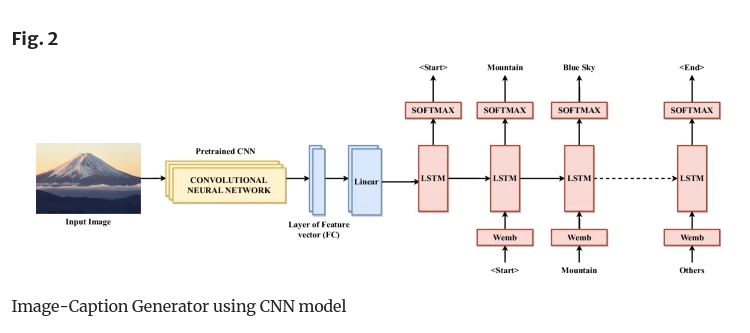

Nessa arquitetura, uma imagem de entrada é processada por uma rede neural convolucional (CNN) pré-treinada em grandes conjuntos de dados. A partir dela, são extraídos vetores de características na saída da última camada totalmente conectada. Esses vetores são então projetados por uma camada linear e servem como entrada para uma rede recorrente do tipo LSTM (Long Short-Term Memory). O LSTM gera sequências de palavras, que são transformadas em probabilidades por meio de uma função de ativação Softmax. Por fim, as palavras são incorporadas e concatenadas para formar a legenda correspondente à imagem de entrada.

### **2.2 Sumário da rede**

In [ ]:
# Usamos o "summary" do "torchinfo" para gerar uma amostra da arquitetura usada no projeto

Encoder:
Layer (type:depth-idx)                        Input Shape               Output Shape              Param #
EncoderCNN                                    [1, 3, 224, 224]          [1, 256]                  --
├─ResNet: 1-1                                 [1, 3, 224, 224]          [1, 256]                  --
│    └─Conv2d: 2-1                            [1, 3, 224, 224]          [1, 64, 112, 112]         (9,408)
│    └─BatchNorm2d: 2-2                       [1, 64, 112, 112]         [1, 64, 112, 112]         (128)
│    └─ReLU: 2-3                              [1, 64, 112, 112]         [1, 64, 112, 112]         --
│    └─MaxPool2d: 2-4                         [1, 64, 112, 112]         [1, 64, 56, 56]           --
│    └─Sequential: 2-5                        [1, 64, 56, 56]           [1, 256, 56, 56]          (215,808)
│    └─Sequential: 2-6                        [1, 256, 56, 56]          [1, 512, 28, 28]          (1,219,584)
│    └─Sequential: 2-7                        [1, 512

Layer (type:depth-idx)                   Output Shape              Param #
DecoderRNN                               [1, 20, 1000]             --
├─Embedding: 1-1                         [1, 20, 256]              256,000
├─Linear: 1-2                            [1, 512]                  131,584
├─Linear: 1-3                            [1, 512]                  131,584
├─LSTM: 1-4                              [1, 20, 512]              1,576,960
├─Linear: 1-5                            [1, 20, 1000]             513,000
Total params: 2,609,128
Trainable params: 2,609,128
Non-trainable params: 0
Total mult-adds (Units.MEGABYTES): 32.57
Input size (MB): 0.00
Forward/backward pass size (MB): 0.29
Params size (MB): 10.44
Estimated Total Size (MB): 10.73

### **2.3 Resumo Geral da Arquitetura**

| Componente | Tipo                          | Saída                 | Parâmetros     |
| ---------- | ----------------------------- | --------------------- | -------------- |
| Encoder    | CNN (ResNet-50 + Linear + BN) | Vetor 256-D           | 24.033.088     |
| Decoder    | Embedding + LSTM + Linear     | Sequência de palavras | 2.609.128      |
| **Total**  | -                             | -                     | **26.642.216** |


### **2.4 Implementação da rede neural (CNN + RNN)** 

In [ ]:
# Codificador de imagens baseado na ResNet-50, para gerar vetores de embedding que podem ser usados pelo decodificador
# O ResNet-50 incorpora 50 blocos residuais de gargalo, dispostos empilhados.
# As camadas iniciais da rede apresentam camadas convolucionais e de agrupamento convencionais para pré-processar a imagem
# antes que ela passe por processamento adicional pelos blocos residuais.
# Por fim, camadas totalmente conectadas, posicionadas no topo da estrutura, utilizam os dados refinados para categorizar a imagem com precisão.


class EncoderCNN(nn.Module):
    def __init__(self, embed_size):
        super().__init__()
        self.resnet = models.resnet50(pretrained=True)
        for p in self.resnet.parameters(): p.requires_grad = False
        self.resnet.fc = nn.Linear(self.resnet.fc.in_features, embed_size)
        self.bn = nn.BatchNorm1d(embed_size, momentum=0.01)

    def forward(self, x):
        x = self.resnet(x)
        return self.bn(x)

In [ ]:
class DecoderRNN(nn.Module):
    def __init__(self, embed_size, hidden_size, vocab_size, num_layers=1, dropout=0.3):
        super().__init__()
        self.embedding = nn.Embedding(vocab_size, embed_size)
        self.lstm = nn.LSTM(embed_size, hidden_size, num_layers, batch_first=True, dropout=dropout)
        self.linear = nn.Linear(hidden_size, vocab_size)  # Camada final que gera logits para cada palavra do vocabulário
        self.init_h = nn.Linear(embed_size, hidden_size)  # Inicializa o estado oculto h0 da LSTM a partir dos features
        self.init_c = nn.Linear(embed_size, hidden_size) # Inicializa o estado da célula c0 da LSTM a partir dos features

    def forward(self, features, captions):
        embeddings = self.embedding(captions)

        h0 = self.init_h(features).unsqueeze(0)
        c0 = self.init_c(features).unsqueeze(0)

        hiddens, _ = self.lstm(embeddings, (h0, c0))

        outputs = self.linear(hiddens)

        return outputs

    def sample(self, features, vocab, max_len=50):
        sampled_ids = []
        states = (self.init_h(features).unsqueeze(0), self.init_c(features).unsqueeze(0))

        sos_idx = vocab.stoi['<SOS>']
        inputs = self.embedding(torch.tensor([sos_idx]).to(features.device)).unsqueeze(1)

        for _ in range(max_len):
            hiddens, states = self.lstm(inputs, states)
            outputs = self.linear(hiddens.squeeze(1))
            _, predicted_idx = outputs.max(1)


            if predicted_idx.item() == vocab.stoi['<EOS>']:
                break

            sampled_ids.append(predicted_idx.item())


            inputs = self.embedding(predicted_idx).unsqueeze(1)

        return sampled_ids

## **3. Dataset**

Utilizamos o Oxford Flowers 102, um dataset com 8.189 imagens de flores de 102 categorias diferentes. Cada imagem possui anotações de classe, e suas descrições textuais. Dessa forma, foi preciso apenas associar cada imagem a seu texto descritivo (ex: "Uma margarida branca com centro amarelo em um campo verde").

Devido a limitações de hardware pela demanda de um GPU de alta capacidade, selecionamos uma amostra aleatória de 5000 imagens de flores, além disso como cada imagem possui 10 legendas associadas, selecionamos a primeira legenda de cada imagem para execução em nossos experimentos.

Mais informações podem ser encontradas no site: [Oxford Flowers 102](https://www.robots.ox.ac.uk/~vgg/data/flowers/102/index.html)

### **3.1 Análise do Dataset**

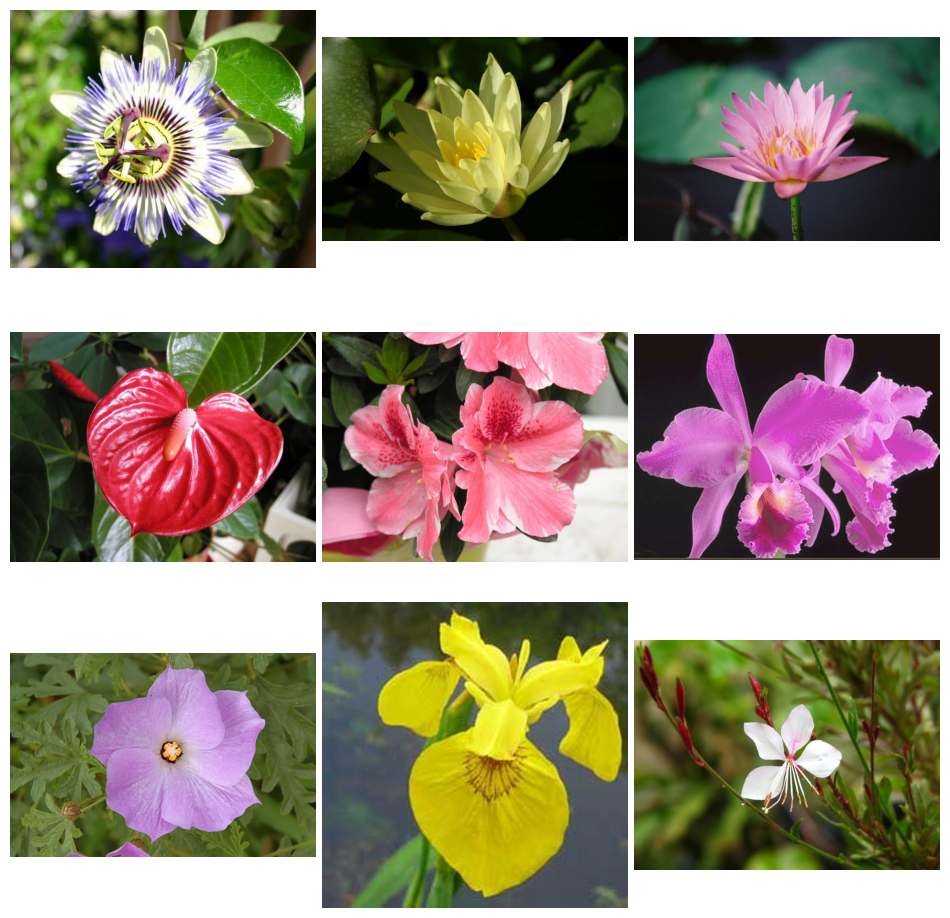

In [58]:
# Aqui temos exemplos de imagens de flores presentes no dataset

In [46]:
# Aqui temos um exemplo do arquivo "captions.csv" que contém as legendas associadas a cada imagem

,file,caption
0,image_00926.jpg,this flower has large white petals with no vis...
1,image_00805.jpg,the petals of the flower are yellow and white ...
2,image_00933.jpg,"this flower is white and yellow in color, with..."
3,image_00934.jpg,yellow and white tipped petals with large gree...
4,image_00860.jpg,"this flower is yellow and white in color, with..."


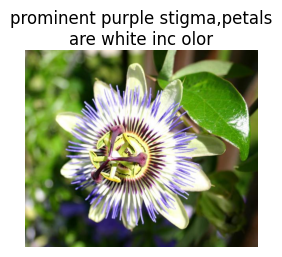

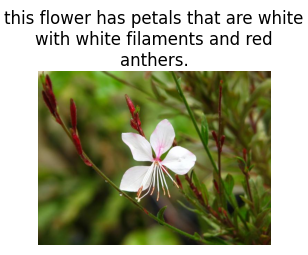

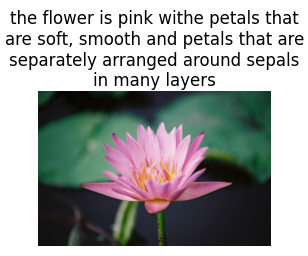

In [42]:
# Aqui temos um exemplo das imagens presentes no dataset com suas respectivas legendas

### **3.2 Pré processamento dos dados**

In [ ]:
csv_caption_path = "/kaggle/input/oxford-102-flower/captions.csv"
images_base_path = "/kaggle/input/oxford-102-flower/102flowers/102flowers/jpg"

In [ ]:
!pip install jiwer nltk pandas pillow torch torchvision tqdm

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.7 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.5 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.9 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 3.1 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 6.5 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 8.2 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 79.1 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 76.5 MB/s eta 0:00:00:00:01
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.9.41
    Uninstalling nvidia-nvjitlink-cu12-12.9.41:
      Successfully uninstalled nvidia-nvjitlink-cu12-12.9.41
  Attempting uninstall: nvidia-curand-cu12
    Found existi

In [ ]:
from jiwer import wer
import nltk
from nltk.translate.bleu_score import corpus_bleu, sentence_bleu, SmoothingFunction
import os
import pandas as pd
from PIL import Image
import re
from sklearn.model_selection import train_test_split
import torch
import torch.nn as nn
import torchvision.models as models
import torchvision.transforms as transforms
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from tqdm.notebook import tqdm

In [ ]:
# Baixa recursos do NLTK
nltk.download('punkt')
nltk.download('punkt_tab')

# Define dispositivo
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

[nltk_data] Downloading package punkt to /usr/share/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package punkt_tab to /usr/share/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!


In [ ]:
# Padronização do tamanho das imagens em 480x480 e ajuste dos valores dos pixels ao mesmo padrão usado durante o treinamento de redes pré-treinadas
transform = transforms.Compose([
    transforms.Resize((480, 480)),
    transforms.ToTensor(),
    transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225)),
])

In [ ]:
# Técnica de suavização (smoothing) na pontuação BLEU, evitando que a pontuação caia para zero quando a frase gerada é muito curta
smooth = SmoothingFunction().method1

In [ ]:
# Construção do vocabulário do nosso modelo com a restrição de que para uma palavra entrar no vocabulário ela tenha frequência pelo menos 4

class Vocabulary:
    def __init__(self, freq_threshold=3):
        self.itos = {0: "<PAD>", 1: "<SOS>", 2: "<EOS>", 3: "<UNK>"}

        self.stoi = {v: k for k, v in self.itos.items()}

        self.freq_threshold = freq_threshold

    def __len__(self):
        return len(self.itos)

    @staticmethod
    def _tokenize(text):
        text = text.lower()
        text = re.sub(r'[^a-z\s]', '', text)
        return nltk.tokenize.word_tokenize(text)

    def build_vocabulary(self, sentence_list):
        frequencies = {}
        idx = 4

        for sentence in sentence_list:
            for word in self._tokenize(sentence):
                frequencies[word] = frequencies.get(word, 0) + 1
        for word, count in frequencies.items():
            if count >= self.freq_threshold:
                self.stoi[word] = idx
                self.itos[idx] = word
                idx += 1

    def numericalize(self, text):
        tokenized_text = self._tokenize(text)
        return [
            self.stoi.get(token, self.stoi["<UNK>"]) for token in tokenized_text
        ]

In [ ]:
# Criação de um dataset personalizado de imagens de flores com legendas, realizamos aqui a conversão da imagem para RGB
# e realizar o pré-processamento das legendas das imagens, convertendo para lowecase e tokenizando,
# além de converter os tokens para seus respectivos índices no vocabulário

class FlowerDataset(Dataset):
    def __init__(self, root_dir, captions_file, vocab, transform):
        self.root_dir = root_dir
        self.df = pd.read_csv(captions_file)
        self.transform = transform
        self.vocab = vocab

        self.image_paths = self.df['file'].tolist()
        self.captions = self.df['caption'].tolist()

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img_path = os.path.join(self.root_dir, self.image_paths[idx])
        caption = self.captions[idx]

        image = Image.open(img_path).convert('RGB')
        if self.transform:
            image = self.transform(image)

        numericalized = [self.vocab.stoi['<SOS>']] + \
                        self.vocab.numericalize(caption) + \
                        [self.vocab.stoi['<EOS>']]

        return image, torch.tensor(numericalized)

In [ ]:
# Função usada no pré-processamento dos dados em um batch dentro de um DataLoader do PyTorch.
# Importante quando temos sequências de comprimentos variáveis, como frases ou legendas, que precisam ser padronizadas antes de serem passadas à rede neural.

def collate_fn(batch):
    images = torch.stack([item[0] for item in batch])
    captions = [item[1] for item in batch]

    lengths = [len(caption) for caption in captions]

    captions_padded = nn.utils.rnn.pad_sequence(captions, batch_first=True, padding_value=0)

    return images, captions_padded, lengths

### **3.3 Divisão do dataset**

In [ ]:
df = pd.read_csv(csv_caption_path)
df = df.sample(n=5000, random_state=42)

In [ ]:
train_df, temp_df = train_test_split(df, test_size=0.2, random_state=42, shuffle=True)
val_df, test_df = train_test_split(temp_df, test_size=0.5, random_state=42)

In [ ]:
# train_df.to_csv("train.csv", index=False)
# val_df.to_csv("val.csv", index=False)
# test_df.to_csv("test.csv", index=False)

In [ ]:
df = pd.read_csv("train.csv")
vocab = Vocabulary()
vocab.build_vocabulary(df['caption'].tolist())

In [ ]:
train_dataset = FlowerDataset(root_dir=images_base_path, captions_file="train.csv", vocab= vocab, transform=transform)
val_dataset   = FlowerDataset(root_dir=images_base_path, captions_file="val.csv", vocab=vocab, transform=transform)
test_dataset  = FlowerDataset(root_dir=images_base_path, captions_file="test.csv", vocab=vocab, transform=transform)

train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True, collate_fn=collate_fn)
val_loader   = DataLoader(val_dataset, batch_size=16, shuffle=False, collate_fn=collate_fn)
test_loader  = DataLoader(test_dataset, batch_size=16, shuffle=False, collate_fn=collate_fn)

## 4. Treinamento do modelo

Para o treinamento do modelo de geração de legendas, utilizamos o otimizador Adam, amplamente empregado em tarefas de deep learning por sua capacidade de ajustar adaptativamente as taxas de aprendizado para cada parâmetro. A taxa de aprendizado (learning rate) foi ajustada entre 3e-4 e 5e-3, conforme os diferentes experimentos realizados. Os demais hiperparâmetros utilizados estão listados a seguir:

| Hiperparâmetro       | Valor                                |
| -------------------- | ------------------------------------ |
| Otimizador           | Adam                                 |
| Learning rate        | 3e-4 a 5e-3                          |
| Batch size           | definido pelo `train_loader`         |
| Número de épocas     | 5 e 10 (testados)                    |
| Tamanho do embedding | 256                                  |
| Dimensão do LSTM     | 512                                  |
| Função de perda      | CrossEntropyLoss (ignorando `<PAD>`) |

---

##### **Função de Perda**

A função de perda escolhida foi a CrossEntropyLoss, uma escolha apropriada para tarefas de classificação multiclasse, como a geração de palavras em uma legenda. Cada palavra é tratada como uma classe, e a cada passo o modelo precisa prever a próxima palavra correta, dentre todas as opções possíveis no vocabulário.

Além disso, para evitar que os tokens de padding (<PAD>) afetem negativamente o treinamento, esses tokens foram explicitamente ignorados na função de perda, utilizando o parâmetro ignore_index.

Essa função penaliza fortemente o modelo quando ele atribui baixa probabilidade à palavra correta, fornecendo um sinal de erro eficaz que orienta o ajuste dos pesos da rede para melhorar a qualidade das sequências geradas.

---

##### **Processo de Treinamento**

O processo de treinamento seguiu a seguinte lógica:

1. A cada época, o encoder extrai as features da imagem.

2. O decoder recebe essas features junto com as legendas reais deslocadas (captions_in e captions_out) para aprender a prever a sequência.

3. O erro entre a legenda prevista e a real é calculado pela CrossEntropyLoss.

4. O modelo ajusta seus pesos com base nesse erro, utilizando backpropagation.

Durante o treinamento, foram avaliadas também as métricas BLEU (Bilingual Evaluation Understudy) e WER (Word Error Rate), que avaliam a qualidade das legendas geradas com base em similaridade com legendas de referência humanas.

A métrica **BLEU** mede o quão parecida a frase gerada (a "candidata") é com uma ou mais frases de referência de alta qualidade (geradas por humanos). Ela faz isso contando quantas sequências de palavras (n-gramas) da frase candidata também aparecem nas frases de referência. Já a **WER** mede o "custo" para transformar a frase gerada na frase de referência. Dessa forma, é uma medida de distância de edição, calculando o número mínimo de edições (operações) necessárias.

In [ ]:
# Converte a codificação da frase de volta para a original

def decode_caption(indices, vocab):
    words = []
    for idx in indices:
        word = vocab.itos.get(idx, "<UNK>")
        if word == "<EOS>":
            break
        if word not in ("<PAD>", "<SOS>"):
            words.append(word)
    return " ".join(words)

In [ ]:
# Ajusta os pesos (parâmetros) do encoder e do decoder para que, dada uma imagem, o decoder aprenda a gerar uma legenda que seja o mais próximo possível da legenda real.

def train_one_epoch(encoder, decoder, dataloader, criterion, optimizer, vocab_size):
    encoder.train()
    decoder.train()
    total_loss = 0

    for images, captions, _ in tqdm(dataloader):
        images, captions = images.to(device), captions.to(device)

        features = encoder(images)

        captions_in = captions[:, :-1]

        captions_out = captions[:, 1:]

        outputs = decoder(features, captions_in)

        loss = criterion(outputs.reshape(-1, vocab_size), captions_out.reshape(-1))

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        total_loss += loss.item()

    return total_loss / len(dataloader)

In [ ]:
# Avalia o modelo nos dados de avaliação com o objetivo de verificar sua capacidade de generalização
# As métricas BLEU e WER são duas das formas mais comuns de avaliar a qualidade de sistemas que geram texto, como tradutores automáticos, modelos de sumarização e, no seu caso, geradores de legendas para imagens.

def evaluate(encoder, decoder, dataloader, criterion, vocab_size, vocab):
    encoder.eval()
    decoder.eval()
    total_loss = 0
    references = []
    predictions = []

    with torch.no_grad():
        for images, captions, _ in dataloader:
            images, captions = images.to(device), captions.to(device)

            features = encoder(images)

            captions_in = captions[:, :-1]
            captions_out = captions[:, 1:]
            outputs = decoder(features, captions_in)
            loss = criterion(outputs.reshape(-1, vocab_size), captions_out.reshape(-1))
            total_loss += loss.item()

            for i in range(images.size(0)):
                feature = features[i].unsqueeze(0)

                predicted_ids = decoder.sample(feature, vocab)
                pred_caption = decode_caption(predicted_ids, vocab)

                true_ids = captions_out[i].tolist()
                true_caption = decode_caption(true_ids, vocab)

                if pred_caption and true_caption:
                    predictions.append(pred_caption.split())
                    references.append([true_caption.split()])

    avg_loss = total_loss / len(dataloader)

    bleu_score = corpus_bleu(references, predictions, weights=(0.25, 0.25, 0.25, 0.25), smoothing_function=SmoothingFunction().method4)

    pred_sentences = [" ".join(p) for p in predictions]
    ref_sentences = [" ".join(r[0]) for r in references]
    wer_score = wer(ref_sentences, pred_sentences)

    return avg_loss, bleu_score, wer_score

In [ ]:
# Para treinar a rede, usamos o otimizador Adam, com uma taxa de aprendizado de 3e-4, e a função de perda CrossEntropyLoss,
# que ignora os tokens de padding nas frases. A cada iteração, o modelo era alimentado com lotes de imagens e legendas,
# gerava suas próprias previsões e ajustava os pesos com base nos erros cometidos. As legendas foram convertidas em sequências numéricas,
# com tokens especiais para marcar o início "SOS" e o fim "EOS" das frases.

# A geração de cada palavra em uma legenda é fundamentalmente tratada como uma tarefa de classificação multiclasse.
# A cada passo, o modelo deve escolher a próxima palavra dentre todas as opções possíveis no vocabulário.
# A Cross-Entropy é ideal para isso, pois mede a "distância" entre a distribuição de probabilidade gerada pelo modelo (sua confiança em cada palavra)
# e a distribuição de probabilidade real (onde a palavra correta tem 100% de probabilidade).
#  Ao penalizar severamente o modelo quando ele atribui baixa probabilidade à palavra correta, a Cross-Entropy fornece um sinal de erro forte e eficaz,
# guiando o ajuste dos pesos durante o treinamento para que o modelo aprenda a gerar sequências de palavras cada vez mais precisas.

def train_model(hparams, train_loader, val_loader, vocab, device):

    embed_size = hparams['embed_size']
    hidden_size = hparams['hidden_size']
    learning_rate = hparams['lr']
    num_epochs = hparams['epochs']
    vocab_size = len(vocab.stoi)

    encoder = EncoderCNN(embed_size).to(device)
    decoder = DecoderRNN(embed_size, hidden_size, vocab_size).to(device)

    pad_idx = vocab.stoi.get("<PAD>", 0)
    criterion = nn.CrossEntropyLoss(ignore_index=pad_idx)

    params = list(decoder.parameters()) + list(encoder.resnet.fc.parameters()) + list(encoder.bn.parameters())
    optimizer = optim.Adam(params, lr=learning_rate)

    best_val_loss = float('inf')
    for epoch in range(num_epochs):
        train_loss = train_one_epoch(encoder, decoder, train_loader, criterion, optimizer, vocab_size)
        val_loss, val_bleu, val_wer = evaluate(encoder, decoder, val_loader, criterion, vocab_size, vocab)

        print(f"[Epoch {epoch+1}] Train Loss: {train_loss:.4f} | Val Loss: {val_loss:.4f} | BLEU: {val_bleu:.4f} | WER: {val_wer:.4f}")

        # Salvando o melhor modelo
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            torch.save({
                'encoder': encoder.state_dict(),
                'decoder': decoder.state_dict()
            }, "best_model.pth")

    return best_val_loss

In [ ]:
param_grid = [
    {'embed_size': 256, 'hidden_size': 512, 'lr': 5e-3, 'epochs': 10},
    {'embed_size': 256, 'hidden_size': 512, 'lr': 5e-3, 'epochs': 5},
]

results = []
for i, params in enumerate(param_grid):
    print(f"Experimento {i+1} com {params}")
    val_loss = train_model(params, train_loader, val_loader, vocab, device)

Experimento 1 com {'embed_size': 256, 'hidden_size': 512, 'lr': 0.005, 'epochs': 10}


  0%|          | 0/250 [00:00<?, ?it/s]

[Epoch 1] Train Loss: 2.4515 | Val Loss: 2.2571 | BLEU: 0.1545 | WER: 0.7959


  0%|          | 0/250 [00:00<?, ?it/s]

[Epoch 2] Train Loss: 1.9366 | Val Loss: 2.1588 | BLEU: 0.1215 | WER: 0.7728


  0%|          | 0/250 [00:00<?, ?it/s]

[Epoch 3] Train Loss: 1.7233 | Val Loss: 2.1960 | BLEU: 0.1108 | WER: 0.7643


  0%|          | 0/250 [00:00<?, ?it/s]

[Epoch 4] Train Loss: 1.5539 | Val Loss: 2.2317 | BLEU: 0.1212 | WER: 0.7564


  0%|          | 0/250 [00:00<?, ?it/s]

[Epoch 5] Train Loss: 1.4185 | Val Loss: 2.2745 | BLEU: 0.1191 | WER: 0.7804


  0%|          | 0/250 [00:00<?, ?it/s]

[Epoch 6] Train Loss: 1.3087 | Val Loss: 2.3210 | BLEU: 0.1114 | WER: 0.7705


  0%|          | 0/250 [00:00<?, ?it/s]

[Epoch 7] Train Loss: 1.2062 | Val Loss: 2.4058 | BLEU: 0.1128 | WER: 0.7592


  0%|          | 0/250 [00:00<?, ?it/s]

[Epoch 8] Train Loss: 1.1285 | Val Loss: 2.4918 | BLEU: 0.0620 | WER: 0.9020


  0%|          | 0/250 [00:00<?, ?it/s]

[Epoch 9] Train Loss: 1.0638 | Val Loss: 2.5085 | BLEU: 0.1348 | WER: 0.8295


  0%|          | 0/250 [00:00<?, ?it/s]

[Epoch 10] Train Loss: 1.0009 | Val Loss: 2.5627 | BLEU: 0.1161 | WER: 0.7718
Experimento 2 com {'embed_size': 256, 'hidden_size': 512, 'lr': 0.005, 'epochs': 5}


  0%|          | 0/250 [00:00<?, ?it/s]

[Epoch 1] Train Loss: 2.4296 | Val Loss: 2.2128 | BLEU: 0.1131 | WER: 0.7500


  0%|          | 0/250 [00:00<?, ?it/s]

[Epoch 2] Train Loss: 1.9240 | Val Loss: 2.1863 | BLEU: 0.1265 | WER: 0.8231


  0%|          | 0/250 [00:00<?, ?it/s]

[Epoch 3] Train Loss: 1.7108 | Val Loss: 2.2395 | BLEU: 0.1106 | WER: 0.7499


  0%|          | 0/250 [00:00<?, ?it/s]

[Epoch 4] Train Loss: 1.5486 | Val Loss: 2.2332 | BLEU: 0.1223 | WER: 0.7390


  0%|          | 0/250 [00:00<?, ?it/s]

[Epoch 5] Train Loss: 1.4064 | Val Loss: 2.2619 | BLEU: 0.1007 | WER: 0.7785


## **5. Fine tuning modelo pré-treinado BLIP**

Com o objetivo de comparar o desempenho obtido pelo modelo implementado anteriormente, realizamos o fine tuning do modelo BLIP, uma estrutura de pré-treinamento de visão e linguagem (VLP) projetada para tarefas de compreensão e geração. Ele utiliza um legendador para gerar legendas e um filtro para remover as legendas com ruído. Isso aumenta a qualidade dos dados de treinamento e utiliza os dados da web desorganizados de forma mais eficaz.

O checkpoint utilizado está disponível em [Salesforce/blip-image-captioning-base](https://huggingface.co/Salesforce/blip-image-captioning-base)

In [ ]:
!pip install jiwer -q
!pip install evaluate rouge_score sacrebleu transformers datasets
!pip install --upgrade torch torchvision torchaudio --extra-index-url https://download.pytorch.org/whl/cu117
!pip install --upgrade deepspeed

Looking in indexes: https://pypi.org/simple, https://download.pytorch.org/whl/cu117
  Using cached deepspeed-0.17.1.tar.gz (1.5 MB)
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.0/54.0 kB 2.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 422.8/422.8 kB 12.4 MB/s eta 0:00:00
  Created wheel for deepspeed: filename=deepspeed-0.17.1-py3-none-any.whl size=1690731 sha256=6071663ff5e5c31ed1c39420b6b70f4daa78d5c8a9a1b24203aca32240a53986
  Stored in directory: /root/.cache/pip/wheels/34/86/36/22db26525829160fd1c4add33d8a834ec046b90abf45cd363b
Successfully built deepspeed


In [ ]:
import pandas as pd
import os
import csv
from datasets import Dataset, DatasetDict, Features, Value, Image
from transformers import BlipProcessor, BlipForConditionalGeneration, TrainingArguments, Trainer
from evaluate import load
import torch
import numpy as np
from PIL import Image

### **5.1 Pré-processamento dos dados**

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
image_base_path = "/content/drive/MyDrive/102flowers/jpg"

In [ ]:
def update_dataset_with_path_images(captions_path):
    lines = []

    with open(captions_path, "r", encoding="utf-8") as f:
        reader = csv.DictReader(f)
        for row in reader:
            file_name = row["file"]
            line = {
                "image": os.path.join(image_base_path, file_name),
                "caption": row["caption"]
            }
            for key, value in row.items():
                if key not in ("file", "caption"):
                    line[key] = value
            lines.append(line)

    return lines

In [ ]:
def update_dataset_with_path_images(csv_path):
    df = pd.read_csv(csv_path)
    df["file"] = df["file"].apply(lambda x: f"/content/drive/MyDrive/102flowers/jpg/{x}")
    return df[["file", "caption"]]

train_df = update_dataset_with_path_images("/content/train.csv")
val_df = update_dataset_with_path_images("/content/val.csv")
test_df = update_dataset_with_path_images("/content/test.csv")

In [ ]:
train_dataset = Dataset.from_pandas(train_df)
val_dataset = Dataset.from_pandas(val_df)
test_dataset = Dataset.from_pandas(test_df)

for ds in [train_dataset, val_dataset, test_dataset]:
    if "__index_level_0__" in ds.column_names:
        ds = ds.remove_columns(["__index_level_0__"])

features = Features({
    "file": Image(),
    "caption": Value("string")
})

train_dataset = train_dataset.cast(features)
val_dataset = val_dataset.cast(features)
test_dataset = test_dataset.cast(features)

dataset_dict = DatasetDict({
    "train": train_dataset,
    "validation": val_dataset,
    "test": test_dataset,
})

Casting the dataset:   0%|          | 0/4000 [00:00<?, ? examples/s]

Casting the dataset:   0%|          | 0/500 [00:00<?, ? examples/s]

Casting the dataset:   0%|          | 0/500 [00:00<?, ? examples/s]

In [ ]:
dataset_dict

DatasetDict({
    train: Dataset({
        features: ['file', 'caption'],
        num_rows: 4000
    })
    validation: Dataset({
        features: ['file', 'caption'],
        num_rows: 500
    })
    test: Dataset({
        features: ['file', 'caption'],
        num_rows: 500
    })
})

### **5.2 Fine Tuning**

In [ ]:
checkpoint = "Salesforce/blip-image-captioning-base"
processor = BlipProcessor.from_pretrained(checkpoint)
model = BlipForConditionalGeneration.from_pretrained(checkpoint)

def transforms(batch):
    inputs = processor(
        images=batch["file"],
        text=batch["caption"],
        return_tensors="pt",
        padding="max_length",
        truncation=True,
        max_length=128
    )
    inputs["labels"] = inputs["input_ids"]
    return inputs

dataset_dict["train"] = dataset_dict["train"].with_transform(transforms)
dataset_dict["validation"] = dataset_dict["validation"].with_transform(transforms)
dataset_dict["test"] = dataset_dict["test"].with_transform(transforms)

In [ ]:
wer = load("wer")
bleu = load("bleu")

In [ ]:
def compute_metrics(eval_pred):
    predictions, labels = eval_pred

    if isinstance(predictions, tuple):
        predictions = predictions[0]

    predictions = np.argmax(predictions, axis=-1)

    predictions = [[int(token) for token in pred] for pred in predictions]
    labels = [[int(token) for token in label] for label in labels]

    decoded_preds = processor.tokenizer.batch_decode(predictions, skip_special_tokens=True)
    decoded_labels = processor.tokenizer.batch_decode(labels, skip_special_tokens=True)

    decoded_preds = [pred.strip() for pred in decoded_preds]
    decoded_labels = [label.strip() for label in decoded_labels]

    wer_score = wer.compute(predictions=decoded_preds, references=decoded_labels)
    bleu_score = bleu.compute(predictions=decoded_preds, references=[[ref] for ref in decoded_labels])

    return {
        "wer": wer_score,
        "bleu": bleu_score["bleu"],
    }

In [ ]:
training_args = TrainingArguments(
    output_dir="blip-flower-captioning",
    learning_rate=5e-5,
    per_device_train_batch_size=4,
    per_device_eval_batch_size=4,
    gradient_accumulation_steps=2,
    num_train_epochs=5,
    eval_strategy="epoch",
    save_strategy="epoch",
    logging_steps=50,
    load_best_model_at_end=True,
    fp16=torch.cuda.is_available(),
    remove_unused_columns=False,
    report_to="none",
    label_names=["labels"]
)

In [ ]:
trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=dataset_dict["train"],
    eval_dataset=dataset_dict["validation"],
    compute_metrics=compute_metrics,
    tokenizer=processor.tokenizer,
)

/tmp/ipython-input-43-3200579458.py:1: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


In [ ]:
trainer.train()

Epoch,Training Loss,Validation Loss,Wer,Bleu
1,0.238500,0.247836,0.509568,0.289064
2,0.192700,0.236611,0.487678,0.309433
3,0.161200,0.236054,0.478545,0.313919
4,0.113200,0.250267,0.477385,0.321788
5,0.078500,0.265897,0.477385,0.323247


There were missing keys in the checkpoint model loaded: ['text_decoder.cls.predictions.decoder.bias'].


TrainOutput(global_step=2500, training_loss=0.29864742221832274, metrics={'train_runtime': 3941.4032, 'train_samples_per_second': 5.074, 'train_steps_per_second': 0.634, 'total_flos': 1.186847304450048e+19, 'train_loss': 0.29864742221832274, 'epoch': 5.0})

In [ ]:
trainer.save_model("blip-flower")
processor.save_pretrained("blip-flower")

[]

In [ ]:
test_metrics = trainer.evaluate(eval_dataset=dataset_dict["test"])
print("Resultados no conjunto de teste:")
for metric, value in test_metrics.items():
    print(f"{metric}: {value:.4f}")

Resultados no conjunto de teste:
eval_loss: 0.2058
eval_wer: 0.4546
eval_bleu: 0.3336
eval_runtime: 188.5721
eval_samples_per_second: 2.6520
eval_steps_per_second: 0.6630
epoch: 5.0000


## **6. Resultados**

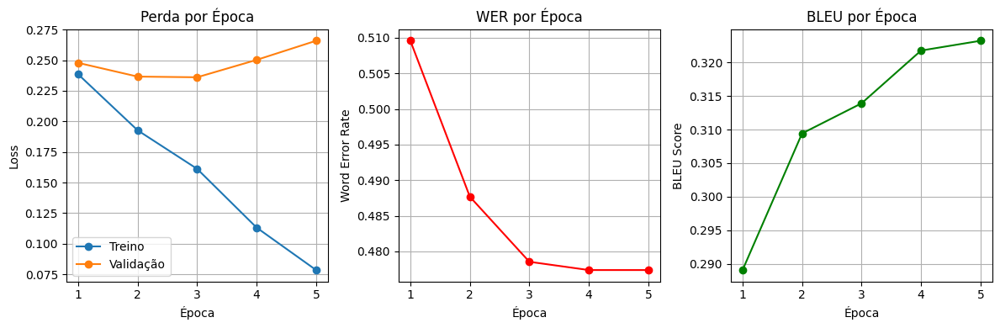

In [59]:
# Dados para o Blip
loss_treino = [0.238500, 0.192700, 0.161200, 0.113200, 0.078500]
loss_valida = [0.247836, 0.236611, 0.236054, 0.250267, 0.265897]
wer = [0.509568, 0.487678, 0.478545, 0.477385, 0.477385]
bleu = [0.289064, 0.309433, 0.313919, 0.321788, 0.323247]

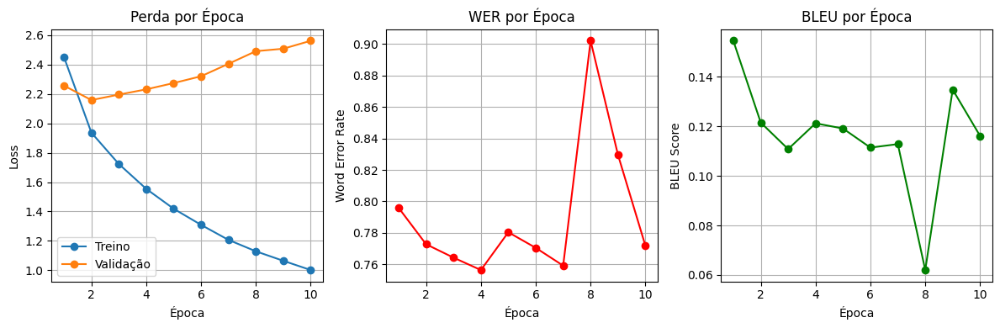

In [61]:
# Loss para o CNN + RNN
train_loss_1 = [2.4515, 1.9366, 1.7233, 1.5539, 1.4185, 1.3087, 1.2062, 1.1285, 1.0638, 1.0009]
val_loss_1 = [2.2571, 2.1588, 2.1960, 2.2317, 2.2745, 2.3210, 2.4058, 2.4918, 2.5085, 2.5627]
bleu_1 = [0.1545, 0.1215, 0.1108, 0.1212, 0.1191, 0.1114, 0.1128, 0.0620, 0.1348, 0.1161]
wer_1 = [0.7959, 0.7728, 0.7643, 0.7564, 0.7804, 0.7705, 0.7592, 0.9020, 0.8295, 0.7718]

### **Modelo BLIP**

Durante as 5 épocas do treinamento com o modelo `Salesforce/blip-image-captioning-base`, foi possível observar os seguintes comportamentos:

##### **Perda (Loss)**

A perda de treinamento apresentou uma **queda consistente ao longo das épocas**, partindo de 0.2385 até atingir 0.0785 na última época, indicando que o modelo conseguiu aprender a tarefa de forma eficiente.

Por outro lado, a **perda de validação teve um comportamento estável nas primeiras épocas**, mas passou a **aumentar a partir da época 4**, o que pode indicar o início de **overfitting**, ou seja, o modelo começa a se ajustar demais aos dados de treino, perdendo generalização.

##### **Word Error Rate (WER)**

O WER, que mede a quantidade de erros de palavras na legenda gerada, **caiu significativamente entre as épocas 1 e 3**, passando de 0.509 para 0.478. A partir da época 4, esse valor **se estabilizou**, sugerindo que o modelo atingiu seu melhor desempenho em termos de correção textual por volta da terceira época.

##### **BLEU Score**

O BLEU, métrica amplamente usada para avaliar a similaridade entre a legenda gerada e a legenda de referência, **apresentou crescimento contínuo**, passando de 0.289 na época 1 para 0.323 na época 5. Isso indica uma **melhora gradual na fluência e precisão das legendas geradas**, mesmo com o aumento da perda de validação.

---

Após o treinamento por 5 épocas, o modelo foi avaliado no conjunto de teste. Os resultados são apresentados a seguir:

| Métrica                   | Valor    |
| ------------------------- | -------- |
| **Loss (perda)**          | 0.2058   |
| **WER (Word Error Rate)** | 0.4546   |
| **BLEU Score**            | 0.3336   |
| **Tempo de Avaliação**    | 188.57 s |
| **Amostras por segundo**  | 2.65     |
| **Passos por segundo**    | 0.66     |
| **Época**                 | 5        |

* O valor de **loss (0.2058)** no conjunto de teste indica que o modelo manteve uma boa performance geral, próximo aos valores obtidos durante o treinamento e validação, sugerindo **boa generalização**.

* O **WER de 45,46%** representa uma taxa de erro de palavras razoável para tarefas de legenda automática, considerando que a avaliação é feita com base em correspondência exata de palavras. Isso mostra que o modelo consegue gerar sentenças próximas da verdade, embora com substituições ou omissões ocasionais.

* O **BLEU Score de 0.3336** é o melhor valor registrado entre os conjuntos de treino, validação e teste. Isso indica que as legendas geradas no teste possuem **boa fluência e similaridade com as legendas de referência**, mesmo que não sejam idênticas palavra por palavra.

* A **estabilidade das métricas de validação e teste**, somada ao aumento contínuo do BLEU score, sugere que o modelo não sofreu overfitting severo e aprendeu representações generalizáveis.

---

##### **Conclusão**

* O modelo BLIP demonstrou boa capacidade de aprendizado, com perda de treino decrescente e melhora nas métricas de WER e BLEU.

* A partir da época 4, observa-se indícios de **overfitting**, o que pode sugerir a aplicação de estratégias como **regularização adicional, early stopping ou ajuste da taxa de aprendizado**.

* O crescimento do BLEU mesmo com aumento do loss de validação indica que a métrica de perda pode não refletir completamente a qualidade linguística das legendas geradas — reforçando a importância do uso de métricas complementares.

### **Modelo CNN + RNN**

Durante as 10 épocas do treinamento com o modelo CNN + RNN, foi possível observar os seguintes comportamentos:

##### **Perda (Loss)**

* A **perda de treinamento** apresentou uma diminuição constante, indicando que o modelo estava aprendendo a tarefa de forma consistente.
* No entanto, a **perda de validação começou a aumentar a partir da 2ª época**, sugerindo um claro caso de **overfitting**. A partir da 6ª época, essa diferença se intensificou, evidenciando que o modelo passou a memorizar os dados de treino em vez de generalizar.

##### **WER (Word Error Rate)**

* O WER oscilou bastante, chegando a valores próximos de **0.75 nas primeiras épocas** e aumentando para **acima de 0.90** na 8ª época, refletindo a queda na qualidade das previsões, especialmente após o início do overfitting.

##### **BLEU Score**

* O BLEU teve uma leve melhora nas primeiras épocas, atingindo um pico inicial de **0.1545**, mas depois oscilou negativamente, chegando a **apenas 0.0620** na 8ª época. Isso demonstra que o modelo começou a gerar sentenças com menor similaridade às de referência, apesar da perda de treino continuar caindo — novamente sinalizando **overfitting**.

---

Após o treinamento, o modelo CNN + RNN foi avaliado no conjunto de teste, com os seguintes resultados:

| Métrica                   | Valor  |
| ------------------------- | ------ |
| **Loss (perda)**          | 2.0252 |
| **WER (Word Error Rate)** | 0.8168 |
| **BLEU Score**            | 0.1306 |

* O valor de **loss no teste** ficou **entre os valores de validação observados**, indicando certa consistência.
* O **WER de 81,68%** demonstra que o modelo teve dificuldades significativas para gerar sentenças próximas à referência, cometendo muitos erros de palavras.
* O **BLEU Score de 0.1306** também é relativamente baixo, evidenciando que as legendas geradas pelo modelo **apresentam baixa similaridade linguística** com as referências humanas.

---

##### **Conclusão**

* O modelo demonstrou capacidade de aprendizado inicial (queda de loss em treino), mas sofreu fortemente com **overfitting**, especialmente a partir da 4ª época.
* O desempenho nas métricas finais (BLEU e WER) foi **inferior ao modelo BLIP**, tanto em validação quanto no conjunto de teste.
* A simplicidade da arquitetura (CNN + LSTM sem atenção) e a ausência de técnicas de regularização como **dropout, early stopping ou augmentação** podem ter contribuído para o desempenho limitado.



## 7. Discussão Geral

Neste trabalho, comparamos o desempenho de dois modelos distintos na tarefa de geração automática de legendas para imagens: um modelo baseado em **CNN + RNN implementado do zero** e o modelo **pré-treinado BLIP (Salesforce/blip-image-captioning-base)** com fine-tuning.

| **Métrica**                      | **BLIP (base pré-treinado)** | **CNN + RNN (implementação própria)** |
| -------------------------------- | ---------------------------- | ------------------------------------- |
| **Perda de Treinamento (final)** | 0.0785                       | 1.0009                                |
| **Perda de Validação (final)**   | 0.2659                       | 2.5627                                |
| **BLEU Score (final)**           | **0.3232**                   | 0.1161                                |
| **WER (final)**                  | **0.4774**                   | 0.7718                                |
| **Perda no Teste**               | **0.2058**                   | 2.0252                                |
| **BLEU no Teste**                | **0.3336**                   | 0.1306                                |
| **WER no Teste**                 | **0.4546**                   | 0.8168                                |
| **Tempo por avaliação (h)**      | 188.57                       | — (não comparável)                     |

Os resultados experimentais evidenciam de forma clara a **superioridade do modelo BLIP** em todas as métricas avaliadas:

* A perda de teste do BLIP foi consideravelmente menor (**0.2058 vs. 2.0252**), indicando melhor ajuste aos dados.
* A **métrica BLEU**, que avalia a fluência e similaridade das legendas com as de referência, foi significativamente maior para o BLIP (**0.3336 contra 0.1306**), mostrando que o modelo pré-treinado gera sentenças mais próximas das verdadeiras.
* O **WER**, que indica o número de erros nas palavras geradas, também foi inferior no BLIP (**45% contra 81%**), reforçando a melhor qualidade textual das saídas.

Em contrapartida, o modelo CNN + RNN apresentou sinais claros de **overfitting a partir da 4ª época**, com a perda de validação aumentando continuamente e as métricas de BLEU e WER oscilando ou piorando ao longo do tempo. Isso sugere que, mesmo com uma queda consistente na perda de treino, o modelo não conseguiu generalizar bem para dados não vistos.

### **Considerações Finais:**

* O uso de **modelos pré-treinados** como o BLIP mostrou-se extremamente vantajoso, principalmente por já incorporarem conhecimento aprendido em grandes corpora de imagens e textos.
* Modelos desenvolvidos do zero, como o CNN + RNN, podem ser úteis para experimentação e aprendizado, mas demandam **técnicas adicionais de regularização**, melhores estratégias de decodificação e arquiteturas mais modernas (como atenção) para competir com modelos de última geração.
* Para trabalhos futuros, seria interessante testar **mecanismos de atenção (Attention ou Transformer)** no modelo próprio, além de técnicas como **beam search**, **dropout**, e **early stopping**, buscando maior robustez e performance.


#### Resultados nos dados de teste

In [ ]:
best_hparams = {'embed_size': 256, 'hidden_size': 512}
embed_size = best_hparams['embed_size']
hidden_size = best_hparams['hidden_size']
vocab_size = len(vocab)


encoder_test = EncoderCNN(embed_size).to(device)
decoder_test = DecoderRNN(embed_size, hidden_size, vocab_size).to(device)

checkpoint = torch.load("best_model.pth", map_location=device)
encoder_test.load_state_dict(checkpoint['encoder'])
decoder_test.load_state_dict(checkpoint['decoder'])


pad_idx = vocab.stoi.get("<PAD>", 0)
criterion = nn.CrossEntropyLoss(ignore_index=pad_idx)


print("Avaliando o modelo no conjunto de teste...")
test_loss, test_bleu, test_wer = evaluate(
    encoder=encoder_test,
    decoder=decoder_test,
    dataloader=test_loader,
    criterion=criterion,
    vocab_size=vocab_size,
    vocab=vocab
)

print("\n--- Resultados Finais no Conjunto de Teste ---")
print(f"Loss de Teste: {test_loss:.4f}")
print(f"BLEU-4 de Teste: {test_bleu:.4f}")
print(f"WER de Teste: {test_wer:.4f}")
print("---------------------------------------------")

Avaliando o modelo no conjunto de teste...

--- Resultados Finais no Conjunto de Teste ---
Loss de Teste: 2.0252
BLEU-4 de Teste: 0.1306
WER de Teste: 0.8168
---------------------------------------------


#### Qualidade dos resultados do modelo implementado (CNN + RNN)

In [ ]:
from PIL import Image
import matplotlib.pyplot as plt


def get_image(id_img, encoder, decoder):
  img_path = os.path.join(images_base_path, test_dataset.image_paths[id_img])

  image = Image.open(img_path).convert('RGB')
  plt.imshow(image)
  plt.axis('off')
  plt.show()

  image_tensor = transform(image).unsqueeze(0).to(device)

  with torch.no_grad():
      features = encoder(image_tensor)
      sampled_ids = decoder.sample(features, vocab)
      caption = decode_caption(sampled_ids, vocab)
  print("Legenda gerada:", caption)
  print("Legenda real:", test_dataset.captions[id_img])

In [ ]:
embed_size = 256
hidden_size = 512
vocab_size = len(vocab.stoi)

encoder = EncoderCNN(embed_size).to(device)
decoder = DecoderRNN(embed_size, hidden_size, vocab_size).to(device)

checkpoint = torch.load("best_model.pth", map_location=device)
encoder.load_state_dict(checkpoint['encoder'])
decoder.load_state_dict(checkpoint['decoder'])

encoder.eval()
decoder.eval()

DecoderRNN(
  (embedding): Embedding(594, 256)
  (lstm): LSTM(256, 512, batch_first=True, dropout=0.3)
  (linear): Linear(in_features=512, out_features=594, bias=True)
  (init_h): Linear(in_features=256, out_features=512, bias=True)
  (init_c): Linear(in_features=256, out_features=512, bias=True)
)

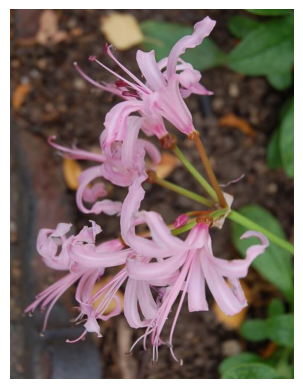

Legenda gerada: this flower has petals that are pink and folded together
Legenda real: flowers with lavender petals and lavender anther filaments and pistils.


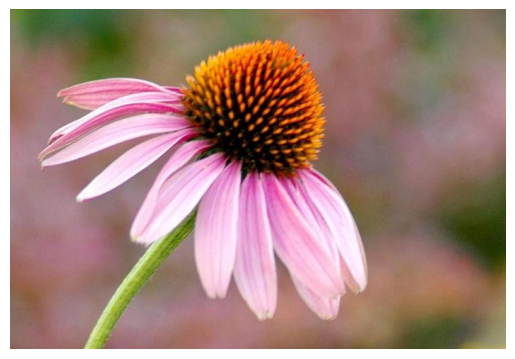

Legenda gerada: this flower is pink and white in color with petals that are oval shaped
Legenda real: light purple petals with orange and black middle green leaves


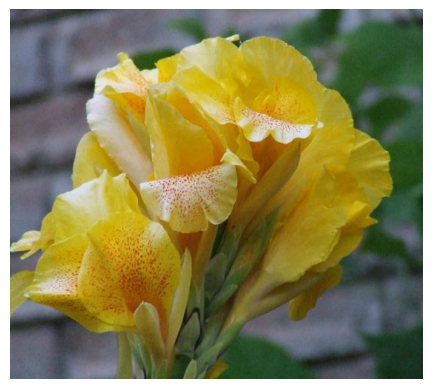

Legenda gerada: the petals of the flower are yellow in color
Legenda real: the color of the petals are yellow maybe a golden yellow with orange specs. style is awesome as well.


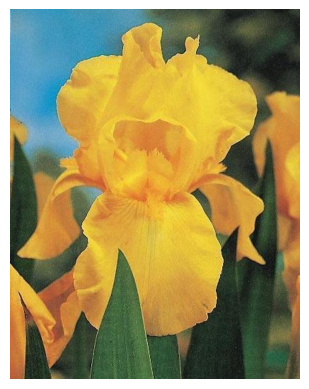

Legenda gerada: the flower has petals that are yellow and very thin
Legenda real: this flower has petals that are yellow and is bell shaped


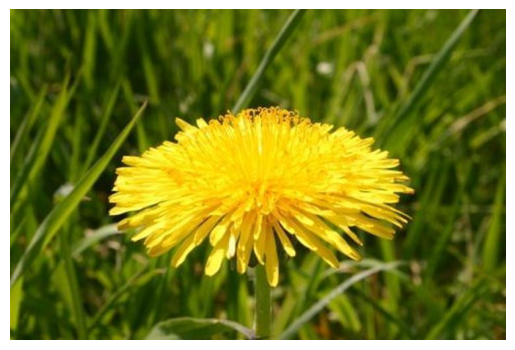

Legenda gerada: this flower is yellow and orange in color with petals that are oval shaped
Legenda real: this flower has petals that are yellow and very stringy


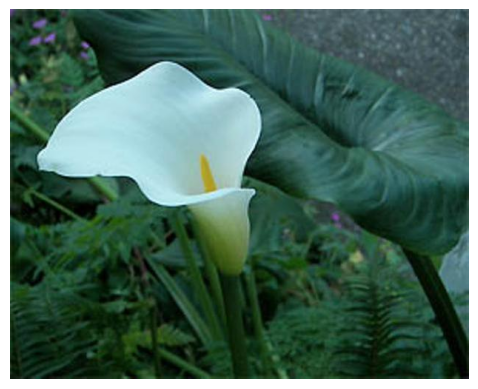

Legenda gerada: this flower is white and yellow in color with petals that are oval shaped
Legenda real: the flower shown has green pedicel with a smooth white petal


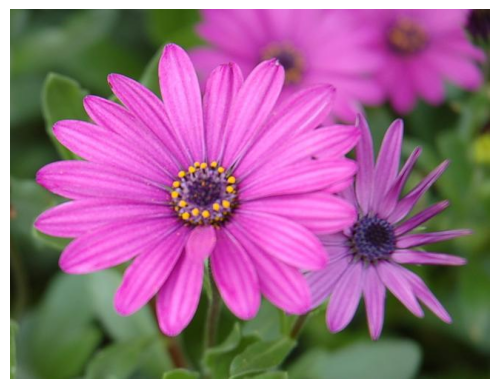

Legenda gerada: this flower has petals that are pink with yellow stamen
Legenda real: this flower is pink and purple in color, with petals that are oval shaped.


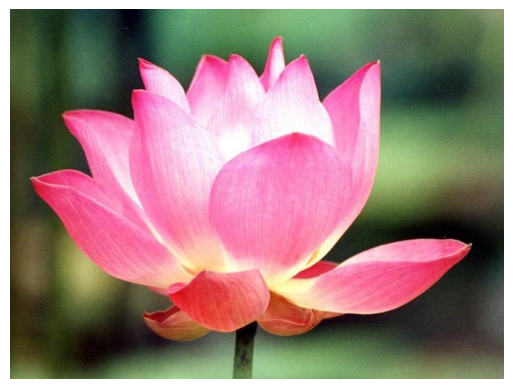

Legenda gerada: this flower is pink and white in color with petals that are oval shaped
Legenda real: this flower has petals that are pink with yellow patches


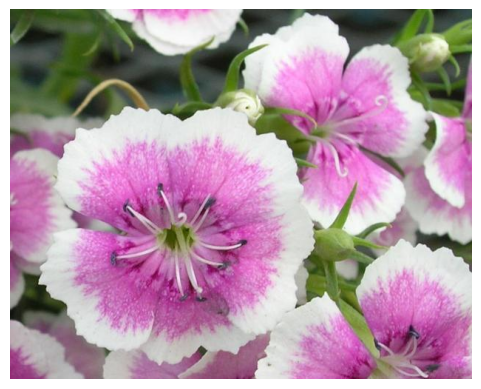

Legenda gerada: this flower has petals that are pink with yellow stamen
Legenda real: this flower has petals that are pink with white edges


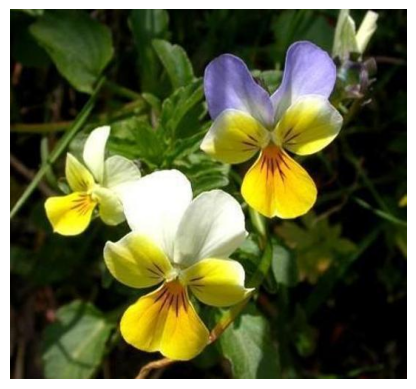

Legenda gerada: the petals are yellow in color
Legenda real: this flower has petals that are white with patches of yellow


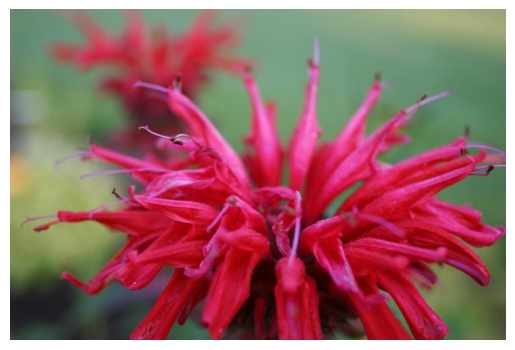

Legenda gerada: the petals of the flower are red in color and have green leaves
Legenda real: this flower is red in color, with petals that are oval shaped and curled.


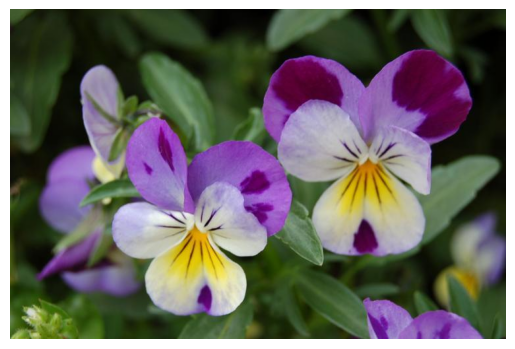

Legenda gerada: this flower has petals that are white with yellow centers
Legenda real: the petals of this flower are pink with a short stigma


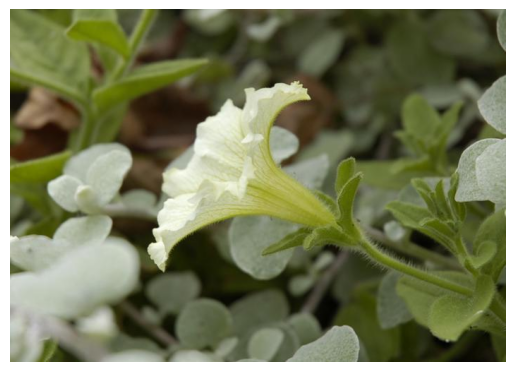

Legenda gerada: this flower has petals that are white with yellow stamen
Legenda real: this flower has petals that are white with short steman


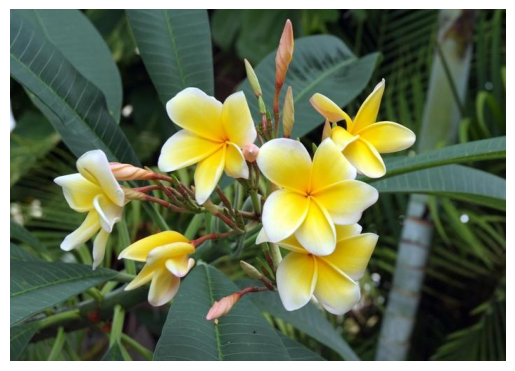

Legenda gerada: this flower is yellow and white in color with petals that are oval shaped
Legenda real: the flower petals are bright white in color with some yellow spoated patches on the inner side


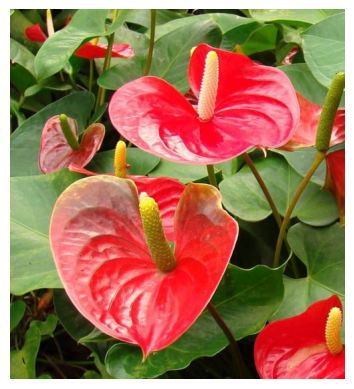

Legenda gerada: this flower is red and yellow in color with petals that are oval shaped
Legenda real: the flower shown has thin red petals as its main feature.


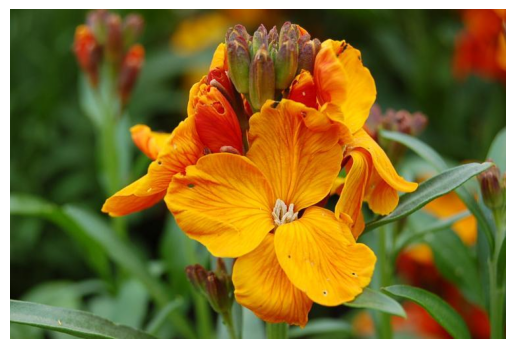

Legenda gerada: the petals of the flower are red in color and have green leaves
Legenda real: this flower is orange in color, with petals that veins.


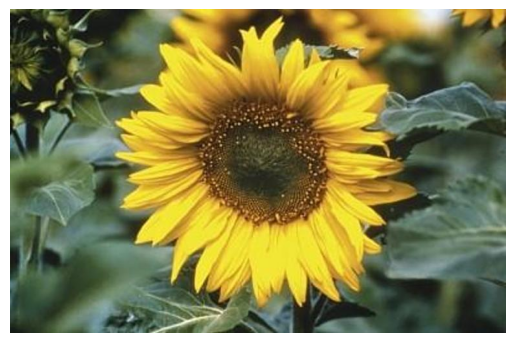

Legenda gerada: the flower has petals that are yellow and very thin
Legenda real: the numerous, pointed petals are small and bright yellow in color while the stamen and stigma are brown and occupy a large portion of the flower.


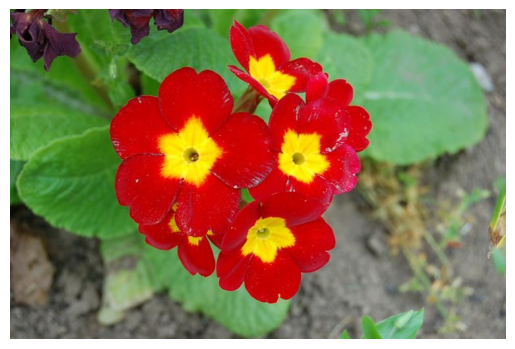

Legenda gerada: the petals of the flower are red in color and have green leaves
Legenda real: this flower is red and yellow in color, and has petals that are multi colored.


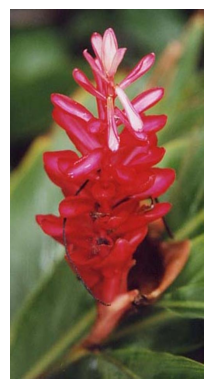

Legenda gerada: this flower is red and yellow in color with petals that are oval shaped
Legenda real: this flower has petals that are pink with many layers


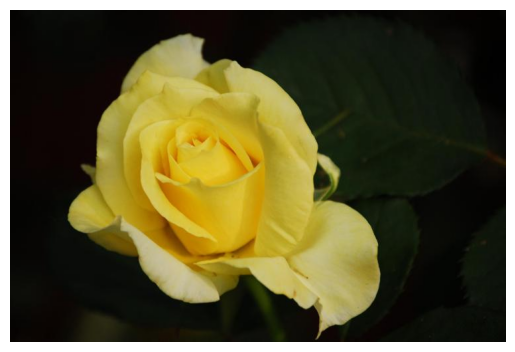

Legenda gerada: the flower has a large yellow petal and a green pedicel
Legenda real: this flower has large layered bright yellow petals that bloom outward.


In [ ]:
import random

chosen_images = [random.randint(1, 500) for _ in range(20)]

for img_id in chosen_images:
    get_image(img_id, encoder, decoder)

#### Qualidade dos resultados do modelo pré-treinado

In [ ]:
import matplotlib.pyplot as plt

def generate_caption(model_path, image_path, device="cuda" if torch.cuda.is_available() else "cpu", max_length=50):
    model = BlipForConditionalGeneration.from_pretrained(model_path).to(device)
    processor = BlipProcessor.from_pretrained(model_path)

    image = Image.open(image_path).convert("RGB")
    plt.imshow(image)
    plt.axis('off')
    plt.show()
    pixel_values = processor(images=image, return_tensors="pt").pixel_values.to(device)

    generated_ids = model.generate(pixel_values, max_length=max_length)
    caption = processor.batch_decode(generated_ids, skip_special_tokens=True)[0]

    print(f"Legenda gerada: {caption}")

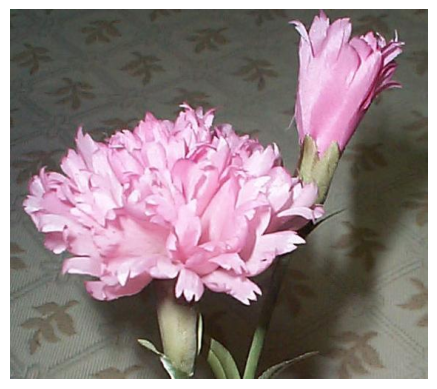

Legenda gerada: this flower has petals that are pink with purple dots
Legenda real: the petals on this flower are pink with no visible stamen.



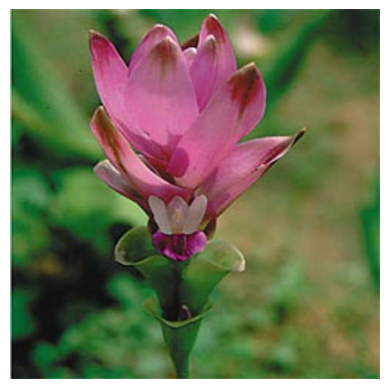

Legenda gerada: this flower has petals that are pink with green shading
Legenda real: the petals of this flower are pink with a short stigma



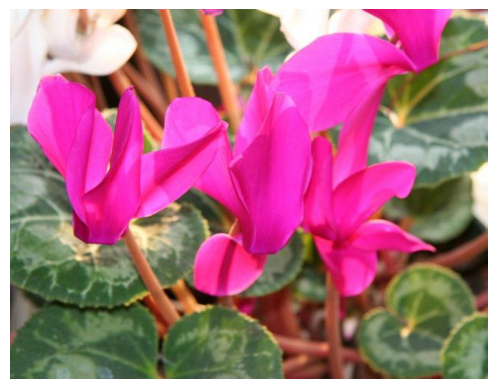

Legenda gerada: this flower has petals that are pink with purple stamen
Legenda real: dark pink petals green and white leads



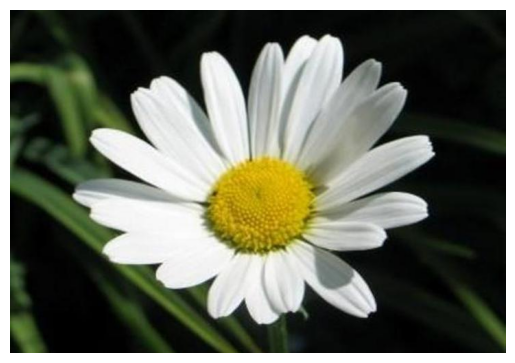

Legenda gerada: this flower has petals that are white with yellow stamen
Legenda real: how much pollen can emanate from the pollen tube?



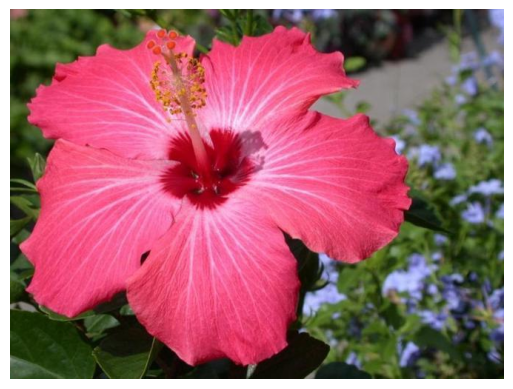

Legenda gerada: this flower has petals that are pink with yellow stamen
Legenda real: this flower has five hot pink petals with white veins from center to almost the outer edge of the petals.



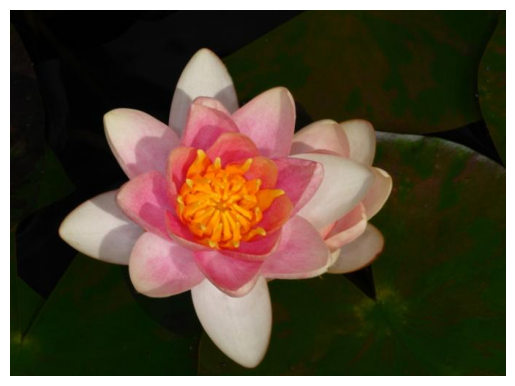

Legenda gerada: this flower has petals that are pink with yellow stamen
Legenda real: this flower has overlapping layers of petals that are in a range of pink, and has a striking orange stamen



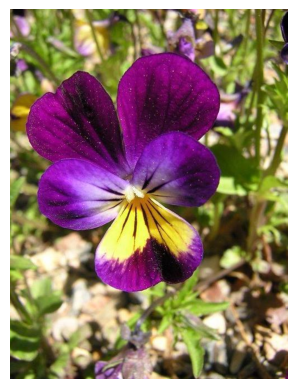

Legenda gerada: this flower has petals that are purple with yellow and black lines
Legenda real: these flowers have a rich violet color, and the bottom two petals have a yellow color with the purple tips.



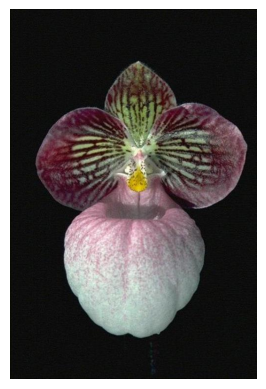

Legenda gerada: this flower has petals that are purple with green lines
Legenda real: this flower has large purple petals and a yellow stigma in the center



In [ ]:
import random

chosen_images = np.random.choice(test_df["file"].unique(), size=8, replace=False)

for img_path in chosen_images:
    generate_caption("/content/blip-flower", img_path)
    row = test_df[test_df["file"] == img_path]
    print(f"Legenda real: {row['caption'].values[0]}")
    print()